<a href="https://colab.research.google.com/github/sailorcosmos101/3D-PINN-for-GW/blob/main/3DPINNforGW_case1_250430.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import os
import sys
import numpy as np
import jax
import jax.numpy as jnp
from jax import random, jit, grad, vmap, jacfwd, jacrev
import optax
import matplotlib.pyplot as plt
from IPython.display import display, clear_output
from matplotlib import cm
import matplotlib as mpl
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from mpl_toolkits.mplot3d import Axes3D
import pickle

In [2]:
#from google.colab import drive
#drive.mount('/content/drive')

In [3]:
# Define the 3D domain
xmin, xmax = 0.0, 22900  # X-boundary
ymin, ymax = 0.0, 22900  # Y-boundary
zmin, zmax = -137.16, 60.96  # Z-boundary

In [4]:
N_b = 1000  # Increase number of boundary points per boundary condition points
N_r = 10000  # Increase number of collocation points within the domain

# Define the boundary conditons
h_const = 0 # Constant head boundary condition
f_no = 0 # No-flow boundary condition
W_re = (7.9*10**-4)*xmax*ymax/N_b # Recharge flow (m3/d)

In [5]:
# Define hydraulic conductivity function
def hydraulic_conductivity(x, y, z):
    """
    Define piecewise hydraulic conductivity K.
    """
    K_x =  jnp.ones_like(x) * 15
    K_y =  jnp.ones_like(y) * 15
    K_z =  jnp.ones_like(z) * 1.5
    return K_x, K_y, K_z

In [6]:
def drain_elev(x, e_max = 30.48, L=12192, x_shift = 2286):
    return (e_max / L) * (x - x_shift)

In [7]:
def drain_discharge(h_pred, x_drain, C_d = 7746):
    d_x = drain_elev(x_drain)
    return jnp.where(h_pred < d_x, 0.0, -C_d * (h_pred - d_x))

In [8]:
def generate_BCs_and_colloc(N_b, N_r, xmin, xmax, ymin, ymax, zmin, zmax):
    bk1, bk2, bk3, bk4, bk5, bk6, r1k, r2k, r3k = jax.random.split(jax.random.PRNGKey(0), 9)

    # 1 --- Constant Head Boundary 생성 ---
    y_linspace_const = jnp.linspace(ymin, ymax, int(jnp.sqrt(N_b)))
    z_linspace_const = jnp.linspace(-91.44, zmax, int(jnp.sqrt(N_b)))  # (-91.44, 60.96)
    Y_mesh_const, Z_mesh_const = jnp.meshgrid(y_linspace_const, z_linspace_const)
    y_const = Y_mesh_const.ravel().reshape(-1, 1)
    z_const = Z_mesh_const.ravel().reshape(-1, 1)
    x_const = jnp.full_like(y_const, xmin)  # x = 0
    bc_const = jnp.ones_like(y_const) * h_const
    BC_const = jnp.concatenate([x_const, y_const, z_const, bc_const], axis=1)

    # 2 --- Recharge Boundary 생성 ---
    x_linspace_re = jnp.linspace(xmin, xmax, int(jnp.sqrt(N_b)))
    y_linspace_re = jnp.linspace(ymin, ymax, int(jnp.sqrt(N_b)))
    X_mesh_re, Y_mesh_re = jnp.meshgrid(x_linspace_re, y_linspace_re)
    x_re = X_mesh_re.ravel().reshape(-1, 1)
    y_re = Y_mesh_re.ravel().reshape(-1, 1)
    z_re = jnp.full_like(x_re, zmax)  # z = 60.96
    bc_re = jnp.ones_like(x_re) * W_re
    BC_re = jnp.concatenate([x_re, y_re, z_re, bc_re], axis=1)

    # 3 --- Drainage Boundary (y=11430, z=60.96) 생성 ---
    x_linspace_dr = jnp.linspace(2286, 14478, int(jnp.sqrt(N_b)))
    y_linspace_dr = jnp.array([11430.0])  # 고정된 y
    X_mesh_dr, _ = jnp.meshgrid(x_linspace_dr, y_linspace_dr)
    x_dr = X_mesh_dr.ravel().reshape(-1, 1)
    y_dr = jnp.full_like(x_dr, 11430.0)
    z_dr = jnp.full_like(x_dr, zmax)  # z = 60.96
    q_dr = jnp.zeros_like(x_dr) # Drainage는 bc 값을 h(x,y,z) 기반으로 계산해야 하므로, 초기 bc는 일단 dummy 값으로
    BC_dr = jnp.concatenate([x_dr, y_dr, z_dr, q_dr], axis=1)

    # 4 --- No-flow Boundary at x=xmin, z <= -91.44 ---
    y_linspace_nf_xmin = jnp.linspace(ymin, ymax, int(jnp.sqrt(N_b)))
    z_linspace_nf_xmin = jnp.linspace(-137.16, -91.44, int(jnp.sqrt(N_b)))  # 하부 구간 (-137.16 ~ -91.44)
    Y_mesh_nf_xmin, Z_mesh_nf_xmin = jnp.meshgrid(y_linspace_nf_xmin, z_linspace_nf_xmin)
    y_nf_xmin = Y_mesh_nf_xmin.ravel().reshape(-1, 1)
    z_nf_xmin = Z_mesh_nf_xmin.ravel().reshape(-1, 1)
    x_nf_xmin = jnp.full_like(y_nf_xmin, xmin)  # x=0 (xmin)
    bc_nf_xmin = jnp.ones_like(y_nf_xmin) * f_no  # dh/dx = 0
    BC_nf_xmin = jnp.concatenate([x_nf_xmin, y_nf_xmin, z_nf_xmin, bc_nf_xmin], axis=1)

    # 5 --- No-flow Boundary (x=xmax) 생성 ---
    y_linspace_nf_xmax = jnp.linspace(ymin, ymax, int(jnp.sqrt(N_b)))
    z_linspace_nf_xmax = jnp.linspace(zmin, zmax, int(jnp.sqrt(N_b)))
    Y_mesh_nf_xmax, Z_mesh_nf_xmax = jnp.meshgrid(y_linspace_nf_xmax, z_linspace_nf_xmax)
    y_nf_xmax = Y_mesh_nf_xmax.ravel().reshape(-1, 1)
    z_nf_xmax = Z_mesh_nf_xmax.ravel().reshape(-1, 1)
    x_nf_xmax = jnp.full_like(y_nf_xmax, xmax)  # x = xmax
    bc_nf_xmax = jnp.ones_like(y_nf_xmax) * f_no  # dh/dx = 0
    BC_nf_xmax = jnp.concatenate([x_nf_xmax, y_nf_xmax, z_nf_xmax, bc_nf_xmax], axis=1)

    # 6 --- No-flow Boundary (y=ymin) 생성 ---
    x_linspace_nf_ymin = jnp.linspace(xmin, xmax, int(jnp.sqrt(N_b)))
    z_linspace_nf_ymin = jnp.linspace(zmin, zmax, int(jnp.sqrt(N_b)))
    X_mesh_nf_ymin, Z_mesh_nf_ymin = jnp.meshgrid(x_linspace_nf_ymin, z_linspace_nf_ymin)
    x_nf_ymin = X_mesh_nf_ymin.ravel().reshape(-1, 1)
    z_nf_ymin = Z_mesh_nf_ymin.ravel().reshape(-1, 1)
    y_nf_ymin = jnp.full_like(x_nf_ymin, ymin)  # y = ymin
    bc_nf_ymin = jnp.ones_like(x_nf_ymin) * f_no  # dh/dy = 0
    BC_nf_ymin = jnp.concatenate([x_nf_ymin, y_nf_ymin, z_nf_ymin, bc_nf_ymin], axis=1)

    # 7 --- No-flow Boundary (y=ymax) 생성 ---
    x_linspace_nf_ymax = jnp.linspace(xmin, xmax, int(jnp.sqrt(N_b)))
    z_linspace_nf_ymax = jnp.linspace(zmin, zmax, int(jnp.sqrt(N_b)))
    X_mesh_nf_ymax, Z_mesh_nf_ymax = jnp.meshgrid(x_linspace_nf_ymax, z_linspace_nf_ymax)
    x_nf_ymax = X_mesh_nf_ymax.ravel().reshape(-1, 1)
    z_nf_ymax = Z_mesh_nf_ymax.ravel().reshape(-1, 1)
    y_nf_ymax = jnp.full_like(x_nf_ymax, ymax)  # y = ymax
    bc_nf_ymax = jnp.ones_like(x_nf_ymax) * f_no  # dh/dy = 0
    BC_nf_ymax = jnp.concatenate([x_nf_ymax, y_nf_ymax, z_nf_ymax, bc_nf_ymax], axis=1)

    # 8 --- No-flow Boundary (z=zmin) 생성 ---
    x_linspace_nf_zmin = jnp.linspace(xmin, xmax, int(jnp.sqrt(N_b)))
    y_linspace_nf_zmin = jnp.linspace(ymin, ymax, int(jnp.sqrt(N_b)))
    X_mesh_nf_zmin, Y_mesh_nf_zmin = jnp.meshgrid(x_linspace_nf_zmin, y_linspace_nf_zmin)
    x_nf_zmin = X_mesh_nf_zmin.ravel().reshape(-1, 1)
    y_nf_zmin = Y_mesh_nf_zmin.ravel().reshape(-1, 1)
    z_nf_zmin = jnp.full_like(x_nf_zmin, zmin)  # z = zmin
    bc_nf_zmin = jnp.ones_like(x_nf_zmin) * f_no  # dh/dz = 0
    BC_nf_zmin = jnp.concatenate([x_nf_zmin, y_nf_zmin, z_nf_zmin, bc_nf_zmin], axis=1)

    # Collocation points 생성
    rkey1, rkey2, rkey3 = jax.random.split(jax.random.PRNGKey(42), 3)
    x_c = jax.random.uniform(rkey1, minval=xmin, maxval=xmax, shape=(N_r, 1))
    y_c = jax.random.uniform(rkey2, minval=ymin, maxval=ymax, shape=(N_r, 1))
    z_c = jax.random.uniform(rkey3, minval=zmin, maxval=zmax, shape=(N_r, 1))
    colloc = jnp.concatenate([x_c, y_c, z_c], axis=1)

    # BC 묶기
    conds = [
    BC_const,    # 0: Constant Head Boundary
    BC_re,       # 1: Recharge
    BC_dr,       # 2: Drain
    BC_nf_xmin,  # 3: No-flow at x=xmin
    BC_nf_xmax,  # 4: No-flow at x=xmax
    BC_nf_ymin,  # 5: No-flow at y=ymin
    BC_nf_ymax,  # 6: No-flow at y=ymax
    BC_nf_zmin   # 7: No-flow at z=zmin
    ]

    return (
    x_const, y_const, z_const, bc_const, BC_const,
    x_re, y_re, z_re,bc_re, BC_re,
    x_dr, y_dr, z_dr, q_dr, BC_dr,
    x_nf_xmin, y_nf_xmin, z_nf_xmin, bc_nf_xmin, BC_nf_xmin,
    x_nf_xmax, y_nf_xmax, z_nf_xmax, bc_nf_xmax, BC_nf_xmax,
    x_nf_ymin, y_nf_ymin, z_nf_ymin, bc_nf_ymin, BC_nf_ymin,
    x_nf_ymax, y_nf_ymax, z_nf_ymax, bc_nf_ymax, BC_nf_ymax,
    x_nf_zmin, y_nf_zmin, z_nf_zmin, bc_nf_zmin, BC_nf_zmin,
    x_c, y_c, z_c, colloc, conds
)

(x_const, y_const, z_const, bc_const, BC_const,
    x_re, y_re, z_re,bc_re, BC_re,
    x_dr, y_dr, z_dr, q_dr, BC_dr,
    x_nf_xmin, y_nf_xmin, z_nf_xmin, bc_nf_xmin, BC_nf_xmin,
    x_nf_xmax, y_nf_xmax, z_nf_xmax, bc_nf_xmax, BC_nf_xmax,
    x_nf_ymin, y_nf_ymin, z_nf_ymin, bc_nf_ymin, BC_nf_ymin,
    x_nf_ymax, y_nf_ymax, z_nf_ymax, bc_nf_ymax, BC_nf_ymax,
    x_nf_zmin, y_nf_zmin, z_nf_zmin, bc_nf_zmin, BC_nf_zmin,
    x_c, y_c, z_c, colloc, conds) = generate_BCs_and_colloc(N_b, N_r, xmin, xmax, ymin, ymax, zmin, zmax)

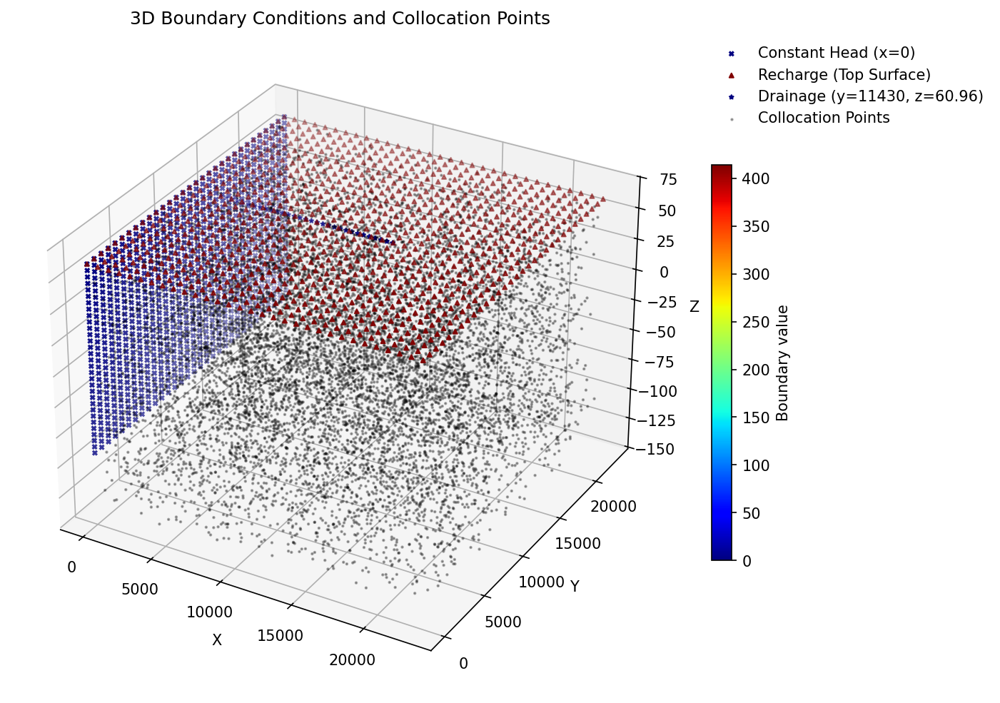

<Figure size 640x480 with 0 Axes>

In [9]:
from mpl_toolkits.mplot3d import Axes3D  # 꼭 포함시켜야 함

def plot_3D_boundary_conditions(
    x_const, y_const, z_const, bc_const,
    x_re, y_re, z_re, bc_re,
    x_dr, y_dr, z_dr, q_dr,
    x_nf_xmin, y_nf_xmin, z_nf_xmin, bc_nf_xmin,
    x_nf_x, y_nf_x, z_nf_x, bc_nf_x,
    x_nf_ymin, y_nf_ymin, z_nf_ymin, bc_nf_ymin,
    x_nf_ymax, y_nf_ymax, z_nf_ymax, bc_nf_ymax,
    x_nf_zmin, y_nf_zmin, z_nf_zmin, bc_nf_zmin,
    x_c, y_c, z_c
):
    fig = plt.figure(figsize=(10, 8), dpi=150)
    ax = fig.add_subplot(111, projection='3d')

    # 모든 bc 값을 모아서 color range 설정
    all_bc_values = jnp.concatenate([
        bc_const, bc_re, q_dr,
        bc_nf_xmin, bc_nf_x, bc_nf_ymin, bc_nf_ymax, bc_nf_zmin
    ])
    vmin, vmax = all_bc_values.min(), all_bc_values.max()

    # Scatter plot settings
    s = 8  # Point size
    alpha = 0.8  # Transparency

    # Plot each boundary condition separately
    scatter1 = ax.scatter(x_const, y_const, z_const, c=bc_const, marker='x', cmap=cm.jet, vmin=vmin, vmax=vmax, s=s, label='Constant Head (x=0)')


    ax.scatter(x_re, y_re, z_re, c=bc_re, marker='^', cmap=cm.jet, vmin=vmin, vmax=vmax, s=s, label='Recharge (Top Surface)')

    ax.scatter(x_dr, y_dr, z_dr, c=q_dr, marker='*', cmap=cm.jet, vmin=vmin, vmax=vmax, s=s, label='Drainage (y=11430, z=60.96)')

    # ax.scatter(x_nf_xmin, y_nf_xmin, z_nf_xmin, c=bc_nf_xmin, marker='o', cmap=cm.jet, vmin=vmin, vmax=vmax, s=s, label='No-flow (x=0, z<=-91.44)')

    # ax.scatter(x_nf_x, y_nf_x, z_nf_x, c=bc_nf_x, marker='s', cmap=cm.jet, vmin=vmin, vmax=vmax, s=s, label='No-flow (x=xmax)')
    # ax.scatter(x_nf_ymin, y_nf_ymin, z_nf_ymin, c=bc_nf_ymin, marker='D', cmap=cm.jet, vmin=vmin, vmax=vmax, s=s, label='No-flow (y=ymin)')
    # ax.scatter(x_nf_ymax, y_nf_ymax, z_nf_ymax, c=bc_nf_ymax, marker='P', cmap=cm.jet, vmin=vmin, vmax=vmax, s=s, label='No-flow (y=ymax)')
    # ax.scatter(x_nf_zmin, y_nf_zmin, z_nf_zmin, c=bc_nf_zmin, marker='X', cmap=cm.jet, vmin=vmin, vmax=vmax, s=s, label='No-flow (z=zmin)')

    # Plot collocation points (small black dots)

    ax.scatter(x_c, y_c, z_c, c='k', marker='.', alpha=0.3, s=5, label='Collocation Points')

    # Labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Boundary Conditions and Collocation Points')

    # Colorbar
    cbar = fig.colorbar(scatter1, ax=ax, shrink=0.6, aspect=20)
    cbar.set_label('Boundary value')

    # Legend
    ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1), frameon=False)

    plt.show()  # 플롯을 화면에 표시
    plt.tight_layout()  # 레이아웃을 자동으로 조정

plot_3D_boundary_conditions(
    x_const, y_const, z_const, bc_const,
    x_re, y_re, z_re, bc_re,
    x_dr, y_dr, z_dr,  q_dr,
    x_nf_xmin, y_nf_xmin, z_nf_xmin, bc_nf_xmin,
    x_nf_xmax, y_nf_xmax, z_nf_xmax, bc_nf_xmax,
    x_nf_ymin, y_nf_ymin, z_nf_ymin, bc_nf_ymin,
    x_nf_ymax, y_nf_ymax, z_nf_ymax, bc_nf_ymax,
    x_nf_zmin, y_nf_zmin, z_nf_zmin, bc_nf_zmin,
    x_c, y_c, z_c
)


In [10]:
def pde_residual_3d_darcy(xyz, h):
    """
    Compute the PDE residual for 3D Darcy's groundwater flow in heterogeneous media.
    """
    xyz = xyz.reshape(-1, 3)
    x, y, z = xyz[:, 0:1], xyz[:, 1:2], xyz[:, 2:3]

    K_x, K_y, K_z = hydraulic_conductivity(x, y, z)

    # Compute gradients (First-order derivatives) of the neural network output (h)
    h_grad = vmap(jacfwd(h))(xyz)

    h_x, h_y, h_z = h_grad[:, 0], h_grad[:, 1], h_grad[:, 2]

    # Compute second derivatives
    def h_x_fn(xyz_):
        return jacfwd(h)(xyz_)[0]

    def h_y_fn(xyz_):
        return jacfwd(h)(xyz_)[1]

    def h_z_fn(xyz_):
        return jacfwd(h)(xyz_)[2]

    h_xx = vmap(jacfwd(h_x_fn))(xyz)
    h_yy = vmap(jacfwd(h_y_fn))(xyz)
    h_zz = vmap(jacfwd(h_z_fn))(xyz)

    # Divergence of flux (∇·q)
    div_q = -(K_x * h_xx[:, 0] + K_y * h_yy[:, 1] + K_z * h_zz[:, 2])

    pde_res = div_q.reshape(-1, 1)
    return pde_res

In [11]:
# Generate 3D grid for visualization
nx, ny, nz = 20, 20, 20
x = np.linspace(xmin, xmax, nx)
y = np.linspace(ymin, ymax, ny)
z = np.linspace(zmin, zmax, nz)
X, Y, Z = np.meshgrid(x, y, z, indexing='ij')
xyz_points = np.vstack([X.ravel(), Y.ravel(), Z.ravel()]).T  # Shape (nx*ny*nz, 3)

In [12]:
# Define the Neural Network Architecture
def neural_net(params, xyz):
    """
    Forward pass through the neural network.
    """
    for w, b in params:
        h_nn = jnp.dot(xyz, w) + b
        xyz = jnp.tanh(h_nn)  # Activation function
    return h_nn.reshape(-1, 1)

In [13]:
def init_mlp(layers, key):
    """
    Initialize the neural network using Xavier initialization.

    Args:
        layers: List defining the number of nodes in each layer (e.g., [1, 50, 50, 1]).
        key: Random key for initialization.

    Returns:
        params: Initialized weights and biases for the network.
    """
    params = []

    for i in range(len(layers) - 1):
        key, subkey = random.split(key)
        bound = jnp.sqrt(6. / (layers[i] + layers[i+1]))
        weights = random.uniform(subkey, (layers[i], layers[i+1]), minval=-bound, maxval=bound)
        biases = jnp.zeros(layers[i+1])
        params.append((weights, biases))
    '''
    for i in range(len(layers) - 1):
        weights = jnp.ones((layers[i], layers[i+1]))  # 모든 가중치 1
        biases = jnp.zeros((layers[i+1],))            # 모든 바이어스 0
        params.append((weights, biases))
    '''
    return params

In [14]:
def pde_recharge_3d_darcy(conds, params):
    def h_single(xyz_single):
        return neural_net(params, xyz_single.reshape(1, -1))[0, 0]

    K_x, K_y, K_z = hydraulic_conductivity(conds[:, 0:1], conds[:, 1:2], conds[:, 2:3])

    h_grad_fn = lambda xyz_: jacfwd(h_single)(xyz_)  # Single input
    h_grad = vmap(h_grad_fn)(conds[:, :3])                    # Vmap over all xyz points

    h_z = h_grad[:, 2]  # z 방향 미분만
    qz = -K_z.flatten() * h_z
    total_re = qz + conds[:, 3]  # Recharge term (W_re)

    return total_re.reshape(-1, 1)

In [25]:
def loss_func(params, colloc, conds, colloc_h_init):
    """
    Computes the total loss for the 3D Darcy PINN model with Face-specific boundary conditions.
    """
    def h(xyz):
        return neural_net(params, xyz)

    # 단일 포인트 input을 위한 h_single 함수 정의
    def h_single(xyz_single):
        xyz_single = xyz_single.reshape(1, -1)  # (1,3)
        return neural_net(params, xyz_single)[0, 0]

    # 1. PDE Residual Loss (colloc points에서)
    pde_res = pde_residual_3d_darcy(colloc, h_single).reshape(-1, 1)
    pde_loss = jnp.mean(jnp.nan_to_num((pde_res) ** 2, nan=1e6, posinf=1e6, neginf=1e6))

    # 2. Dirichlet BC Loss (BC_const = conds[0])
    dbc_loss = 0
    for cond in [conds[0]]:  # Constant head
        x_b, y_b, z_b, h_b = cond[:, [0]], cond[:, [1]], cond[:, [2]], cond[:, [3]]
        bc_xyz = jnp.hstack([x_b, y_b, z_b])
        dbc_loss += jnp.mean((h(bc_xyz) - h_b) ** 2)

    # 3. Recharge BC Loss (BC_re = conds[1])
    pde_re_res = pde_recharge_3d_darcy(conds[1][:, :3], params)
    re_loss = jnp.mean((pde_re_res + conds[1][:, 3:]) ** 2)

    # 4. Neumann BC Losses
    # 방향별 미분 함수 (vmap 적용된 버전)
    dh_dx = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[0])(xyz)
    dh_dy = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[1])(xyz)
    dh_dz = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[2])(xyz)

    # 4-1. Drainage BC (BC_dr = conds[2])
    bc_xyz = conds[2][:, :3]
    x_drain = bc_xyz[:, 0:1]
    h_pred = h(bc_xyz)

    # Darcy 유량 예측
    h_grad_z = dh_dz(bc_xyz)
    K_x, K_y, K_z = hydraulic_conductivity(bc_xyz[:, 0:1], bc_xyz[:, 1:2], bc_xyz[:, 2:3])
    q_predicted = -K_z * h_grad_z

    # 기대 Drain 유량
    q_dr_expected = drain_discharge(h_pred, x_drain)
    drain_loss = jnp.mean((q_predicted - q_dr_expected) ** 2)

    # 4-2. No-flow BCs
    nf_x_loss = 0.0
    for cond in [conds[3], conds[4]]:  # x=xmin, x=xmax
        bc_xyz, bc_grad = cond[:, :3], cond[:, [3]]
        nf_x_loss += jnp.mean((dh_dx(bc_xyz) - bc_grad) ** 2)

    nf_y_loss = 0.0
    for cond in [conds[5], conds[6]]:  # y=ymin, y=ymax
        bc_xyz, bc_grad = cond[:, :3], cond[:, [3]]
        nf_y_loss += jnp.mean((dh_dy(bc_xyz) - bc_grad) ** 2)

    nf_z_loss = 0.0
    cond = conds[7]  # z=zmin
    bc_xyz, bc_grad = cond[:, :3], cond[:, [3]]
    nf_z_loss += jnp.mean((dh_dz(bc_xyz) - bc_grad) ** 2)

    # 5. (Optional) Soft constraint (지금은 주석처리)
    min_violation = jnp.mean(jnp.maximum(0, -h(colloc).squeeze()) ** 2)

    # Total Loss
    total_loss = 1*pde_loss + 5*dbc_loss + 10*(nf_x_loss + nf_y_loss + nf_z_loss) +1e-6*re_loss + 0*drain_loss  + 20*min_violation

    return jnp.sum(total_loss)


In [16]:
def pde_loss_func(params, colloc, conds, colloc_h_init):
    x_c, y_c, z_c = colloc[:, [0]], colloc[:, [1]], colloc[:, [2]]
    # Neural network function for head h(x, y, z)
    h = lambda xyz: neural_net(params, xyz)
    # 1. PDE Residual Loss
    pde_loss = jnp.mean(pde_residual_3d_darcy(colloc, h)**2)
    return pde_loss

In [17]:
def dbc_loss_func(params, colloc, conds, colloc_h_init):
    h = lambda xyz: neural_net(params, xyz)
    # 2. Dirichlet BC Loss (BC_const = conds[0])
    dbc_loss = 0
    for cond in [conds[0]]:  # Constant head
        x_b, y_b, z_b, h_b = cond[:, [0]], cond[:, [1]], cond[:, [2]], cond[:, [3]]
        bc_xyz = jnp.hstack([x_b, y_b, z_b])
        dbc_loss += jnp.mean((h(bc_xyz) - h_b) ** 2)
    return dbc_loss

In [18]:
def re_loss_func(params, colloc, conds, colloc_h_init):
    h = lambda xyz: neural_net(params, xyz)
    # 3. Recharge BC Loss (BC_re = conds[1])
    pde_re_res = pde_recharge_3d_darcy(conds[1][:, :3], params)
    re_loss = jnp.mean(pde_re_res ** 2)
    return re_loss

In [19]:
def drain_loss_func(params, colloc, conds, colloc_h_init):
    h = lambda xyz: neural_net(params, xyz)
    # 단일 포인트 input을 위한 h_single 함수 정의
    def h_single(xyz_single):
        xyz_single = xyz_single.reshape(1, -1)  # (1,3)
        return neural_net(params, xyz_single)[0, 0]
    # 4. Neumann BC Losses
    # 방향별 미분 함수 (vmap 적용된 버전)
    dh_dx = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[0])(xyz)
    dh_dy = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[1])(xyz)
    dh_dz = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[2])(xyz)

    # 4-1. Drainage BC (BC_dr = conds[2])
    bc_xyz = conds[2][:, :3]
    x_drain = bc_xyz[:, 0:1]
    h_pred = h(bc_xyz)

    # Darcy 유량 예측
    h_grad_z = dh_dz(bc_xyz)
    K_z = hydraulic_conductivity(bc_xyz[:, 2:3])
    q_predicted = - K_z * h_grad_z

    # 기대 Drain 유량
    q_dr_expected = drain_discharge(h_pred, x_drain)
    drain_loss = jnp.mean((q_predicted - q_dr_expected) ** 2)
    return drain_loss

In [20]:
def no_flow_loss_func(params, colloc, conds, colloc_h_init):
    h = lambda xyz: neural_net(params, xyz)
    # 단일 포인트 input을 위한 h_single 함수 정의
    def h_single(xyz_single):
        xyz_single = xyz_single.reshape(1, -1)  # (1,3)
        return neural_net(params, xyz_single)[0, 0]
    dh_dx = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[0])(xyz)
    dh_dy = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[1])(xyz)
    dh_dz = lambda xyz: vmap(lambda x: jacfwd(h_single)(x)[2])(xyz)
    # 4-2. No-flow BCs
    nf_x_loss = 0.0
    for cond in [conds[3], conds[4]]:  # x=xmin, x=xmax
        bc_xyz, bc_grad = cond[:, :3], cond[:, [3]]
        nf_x_loss += jnp.mean((dh_dx(bc_xyz) - bc_grad) ** 2)

    nf_y_loss = 0.0
    for cond in [conds[5], conds[6]]:  # y=ymin, y=ymax
        bc_xyz, bc_grad = cond[:, :3], cond[:, [3]]
        nf_y_loss += jnp.mean((dh_dy(bc_xyz) - bc_grad) ** 2)

    nf_z_loss = 0.0
    cond = conds[7]  # z=zmin
    bc_xyz, bc_grad = cond[:, :3], cond[:, [3]]
    nf_z_loss += jnp.mean((dh_dz(bc_xyz) - bc_grad) ** 2)

    return nf_x_loss + nf_y_loss + nf_z_loss

In [21]:
def soft_constraint_loss_func(params, colloc, conds, colloc_h_init):
    h = lambda xyz: neural_net(params, xyz)
    # 5. (Optional) Soft constraint (지금은 주석처리)
    min_violation = jnp.mean(jnp.maximum(0, -h(colloc).squeeze()) ** 2)
    return min_violation

In [22]:
def total_loss_func(params, colloc, conds, colloc_h_init):
  pde_loss = pde_loss_func(params, colloc, conds, colloc_h_init)
  dbc_loss = dbc_loss_func(params, colloc, conds, colloc_h_init)
  re_loss = re_loss_func(params, colloc, conds, colloc_h_init)
  drain_loss = drain_loss_func(params, colloc, conds, colloc_h_init)
  no_flow_loss = no_flow_loss_func(params, colloc, conds, colloc_h_init)
  min_violation = soft_constraint_loss_func(params, colloc, conds, colloc_h_init)
  total_loss = 1*pde_loss + 0*dbc_loss + 1e-3*re_loss + 1e-2*no_flow_loss + 1*min_violation
  return total_loss

In [23]:
colloc_h_init = jnp.ones((colloc.shape[0], 1)) * 60

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 0: Loss = 1.7059e+00
Epoch 0: Loss = 1.7059e+00


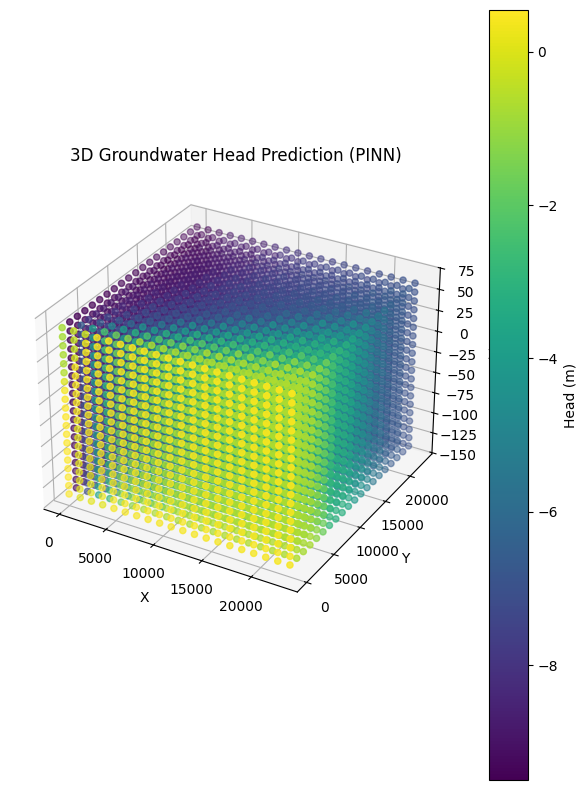

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 10: Loss = 2.1598e+00
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 20: Loss = 3.5201e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 30: Loss = 2.7225e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters s

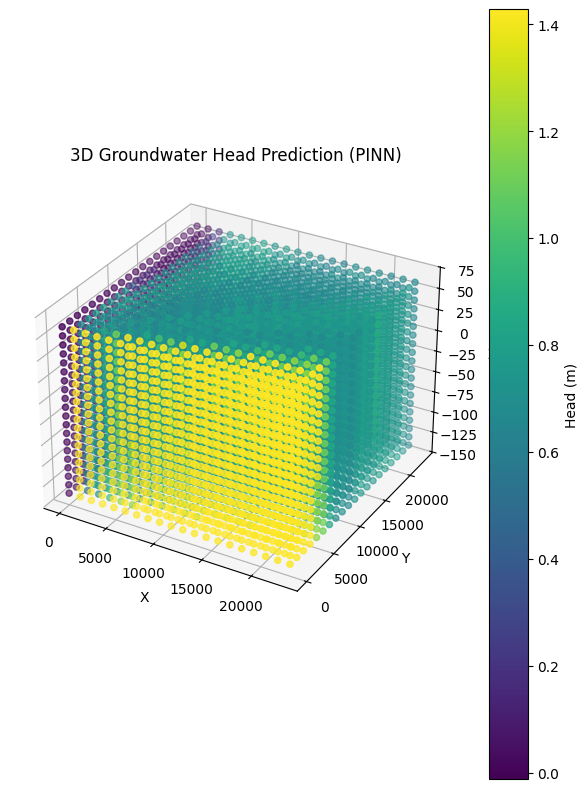

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 110: Loss = 2.2594e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 120: Loss = 2.2593e-01
✅ Parameters saved at /content/drive/MyD

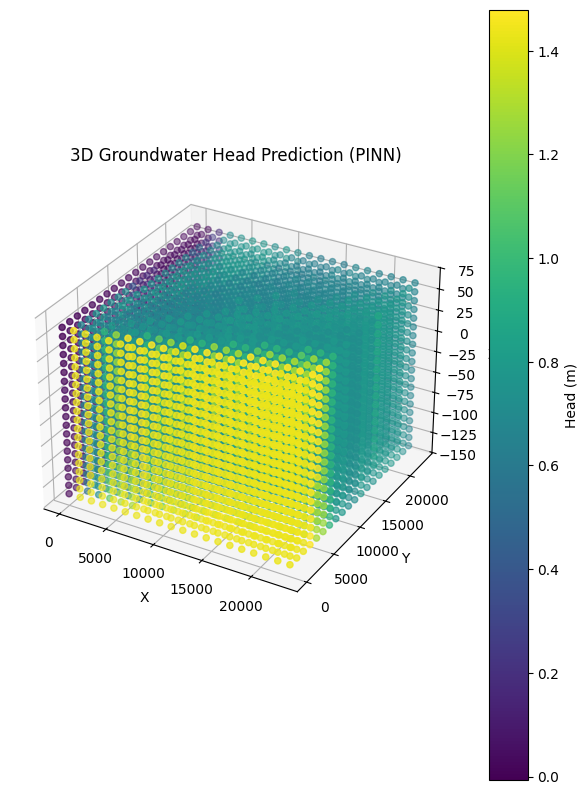

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 210: Loss = 2.2589e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softcon

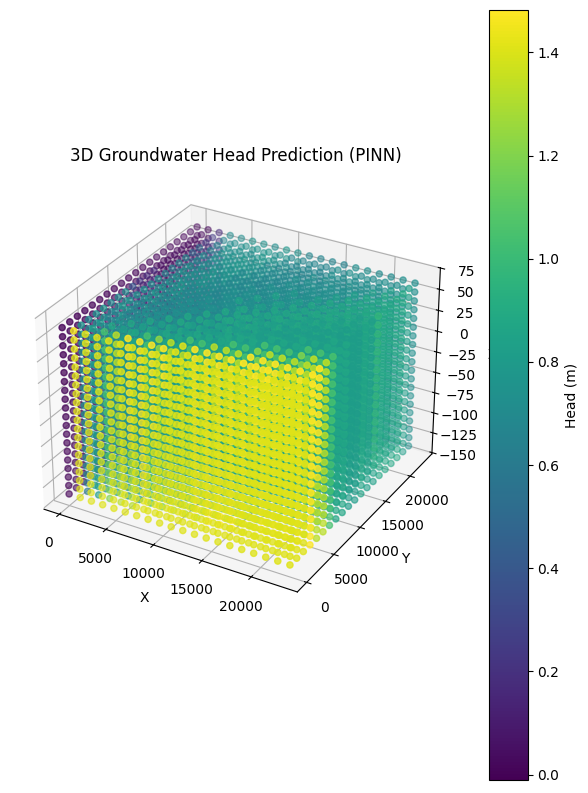

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 310: Loss = 2.2588e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 320: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyD

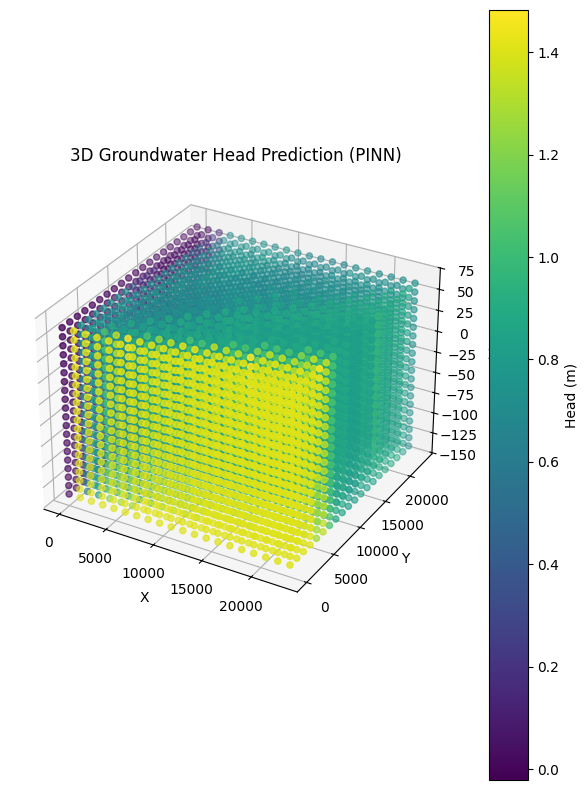

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 410: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softcon

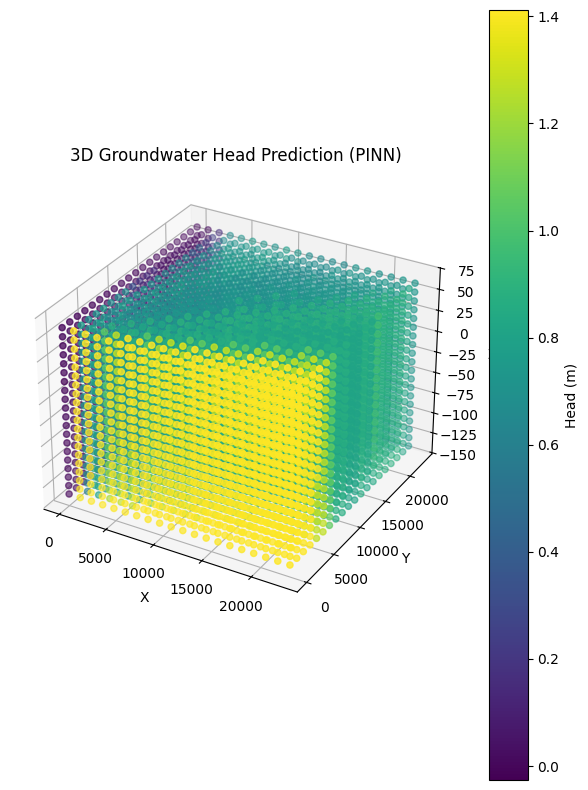

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 510: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 520: Loss = 2.2587e-01
Epoch 530: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 540: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_so

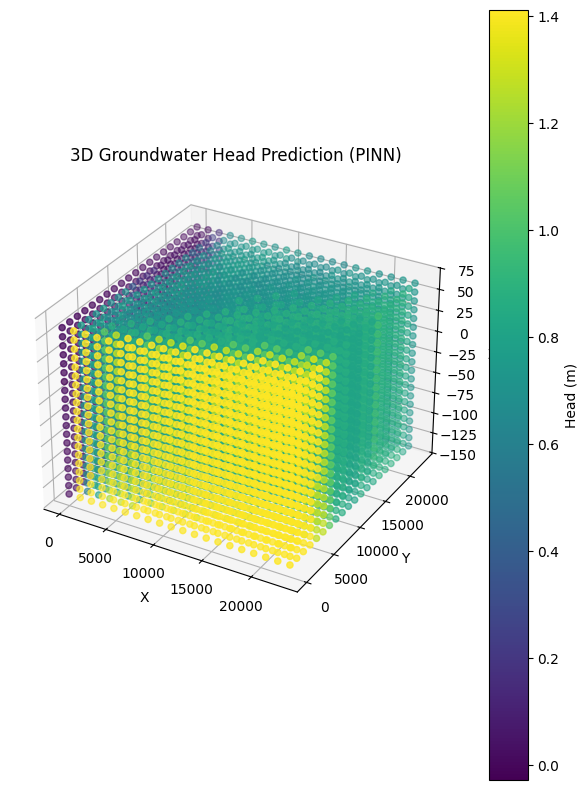

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 610: Loss = 2.2587e-01
Epoch 620: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 630: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 640: Loss = 2.2587e-01
Epoch 650: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/driv

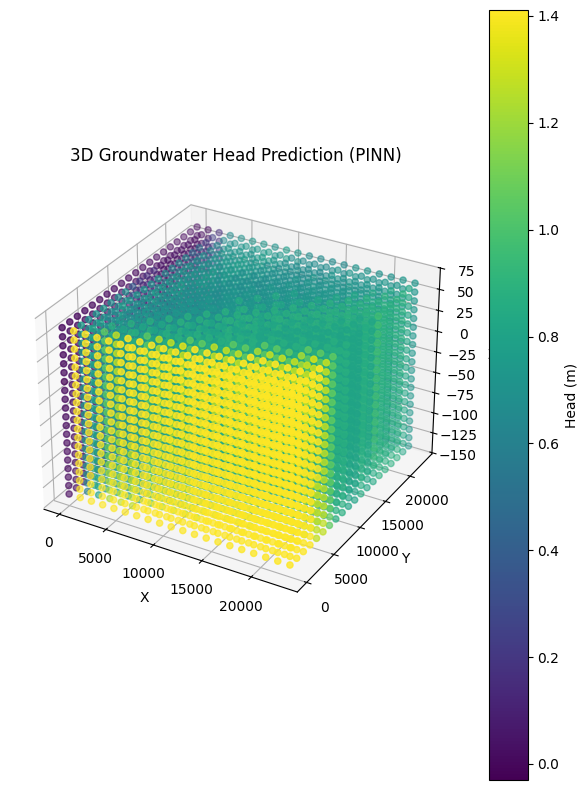

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 710: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 720: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyD

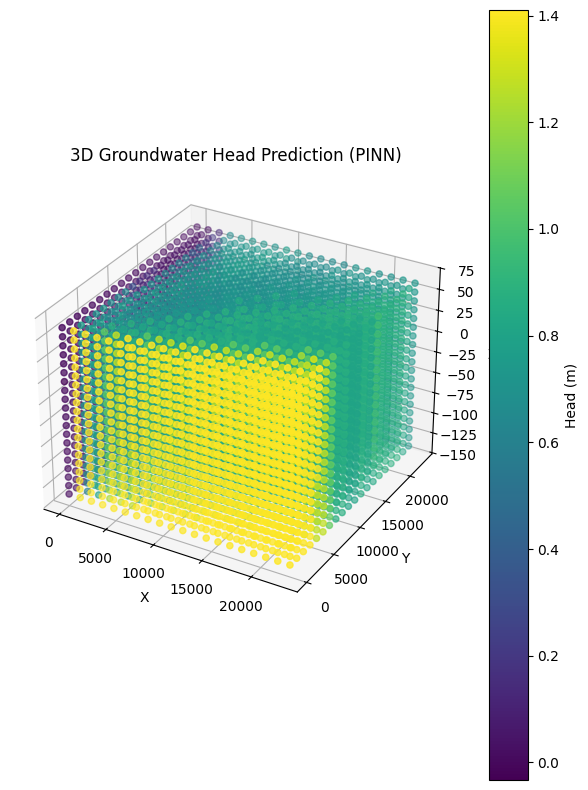

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 810: Loss = 2.2586e-01
Epoch 820: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 830: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 840: Loss = 2.2586e-01
Epoch 850: Loss = 2.2586e-01
Epoch 860: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 870: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_04

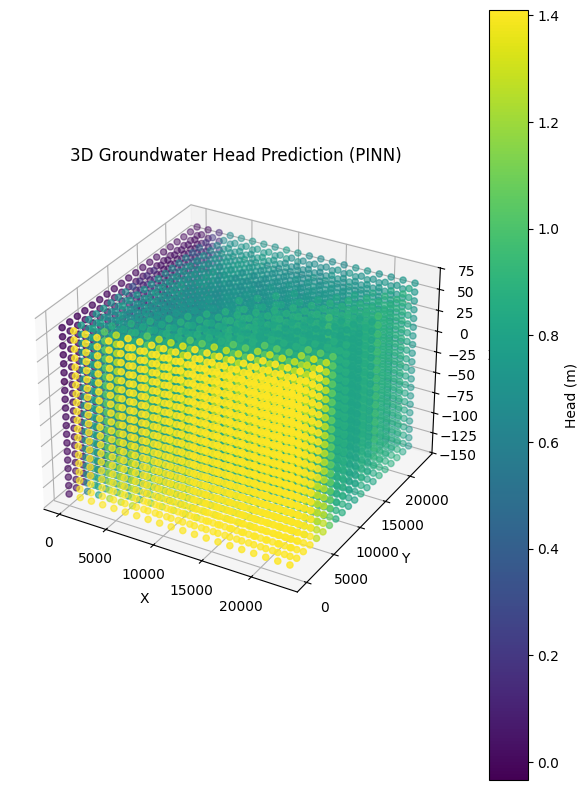

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 910: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 920: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 930: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 940: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_so

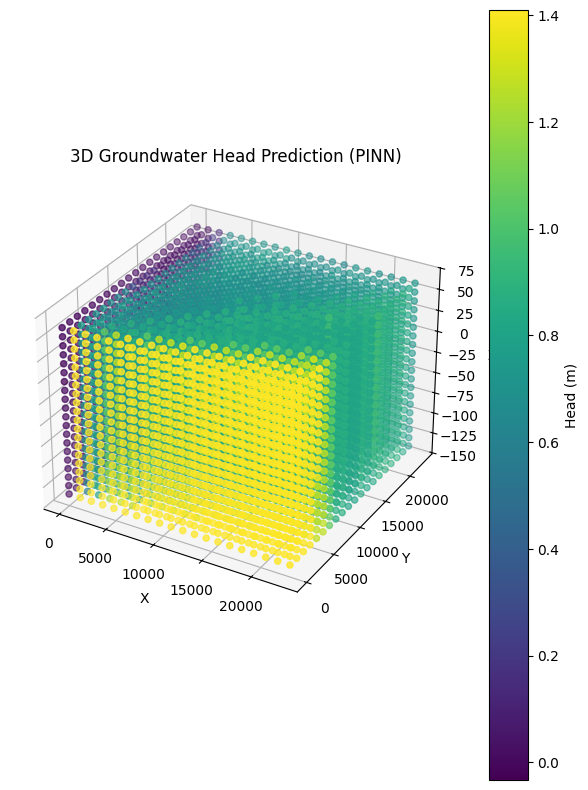

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1010: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1020: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1030: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1040: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1050: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content

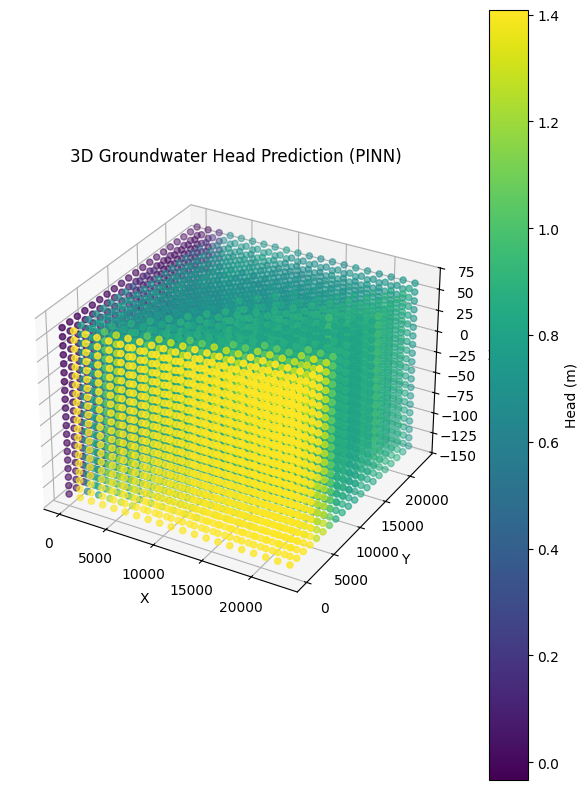

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1110: Loss = 2.2586e-01
Epoch 1120: Loss = 2.2586e-01
Epoch 1130: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1140: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1150: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1160: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl


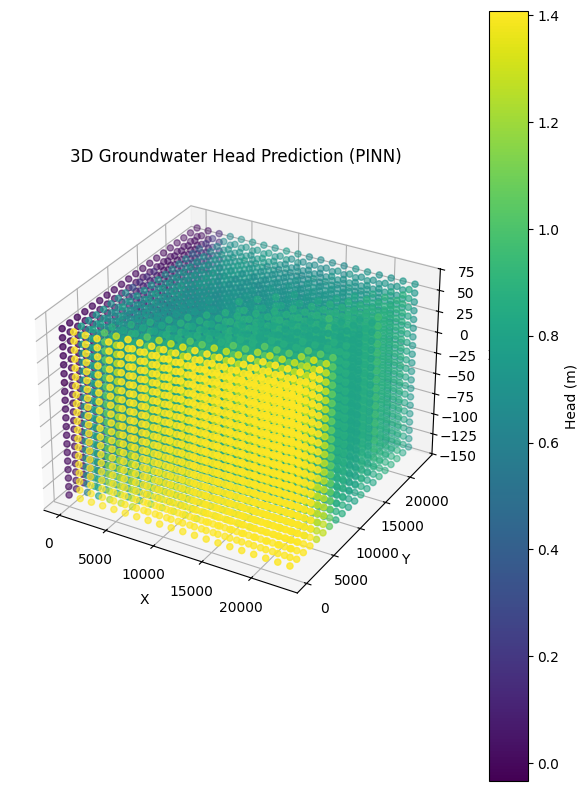

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1210: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1220: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1230: Loss = 2.2586e-01
Epoch 1240: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1250: Loss = 2.2586e-01
Epoch 1260: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1270: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1280: Loss = 2.2586e-01
✅ Parameters saved at 

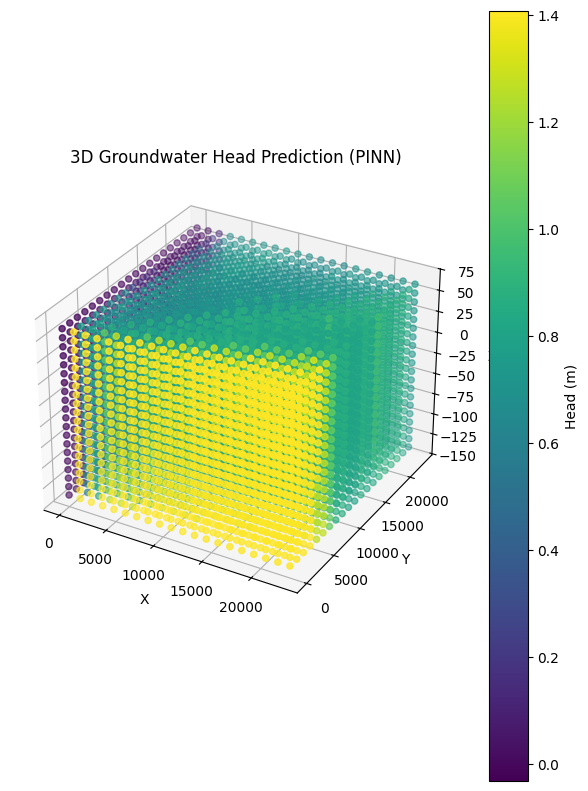

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1310: Loss = 2.2586e-01
Epoch 1320: Loss = 2.2586e-01
Epoch 1330: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1340: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1350: Loss = 2.2586e-01
Epoch 1360: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1370: Loss = 2.2586e-01
Epoch 1380: Loss = 2.2586e-01
Epoch 1390: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_1400.pkl
Epoch 1400: Loss = 2.2586e-01
Epoch 1400: Loss = 2.2586e-01


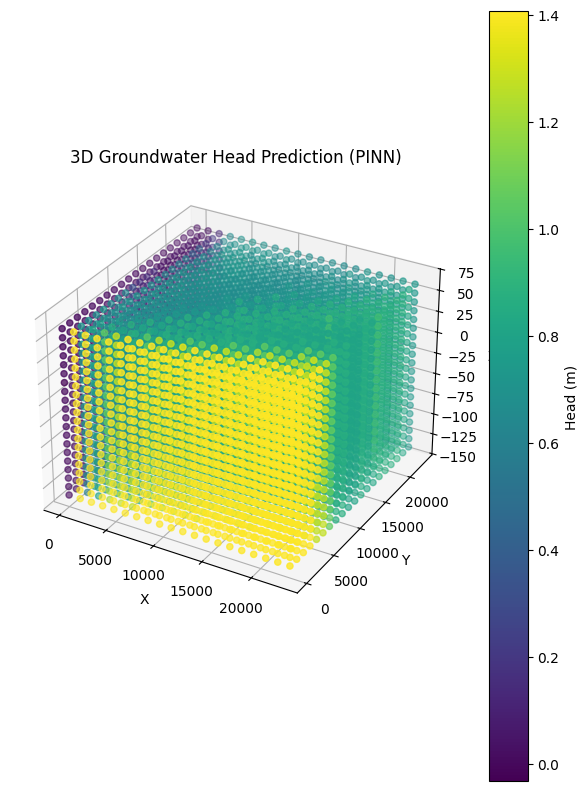

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1410: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1420: Loss = 2.2586e-01
Epoch 1430: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1440: Loss = 2.2586e-01
Epoch 1450: Loss = 2.2586e-01
Epoch 1460: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1470: Loss = 2.2586e-01
Epoch 1480: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1490: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_1500.pkl


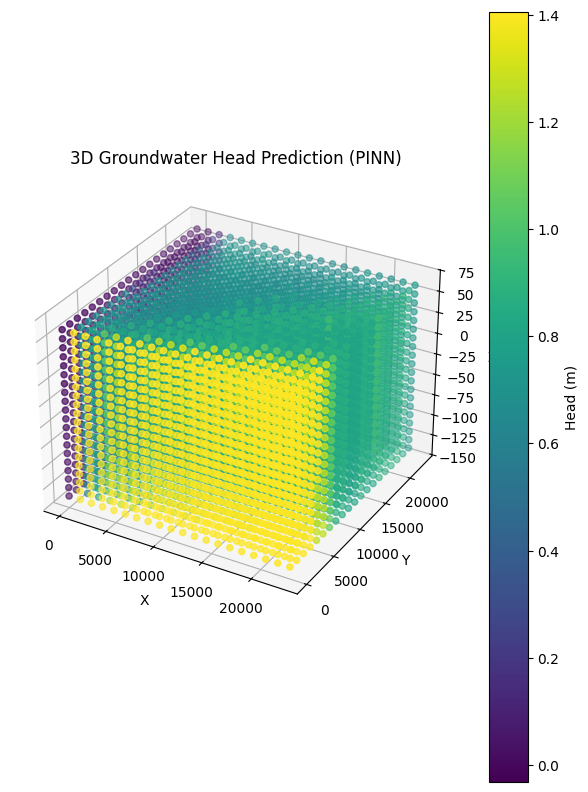

Epoch 1510: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1520: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1530: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1540: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1550: Loss = 2.2586e-01
Epoch 1560: Loss = 2.2586e-01
Epoch 1570: Loss = 2.2586e-01
Epoch 1580: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1590: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_1600.pkl


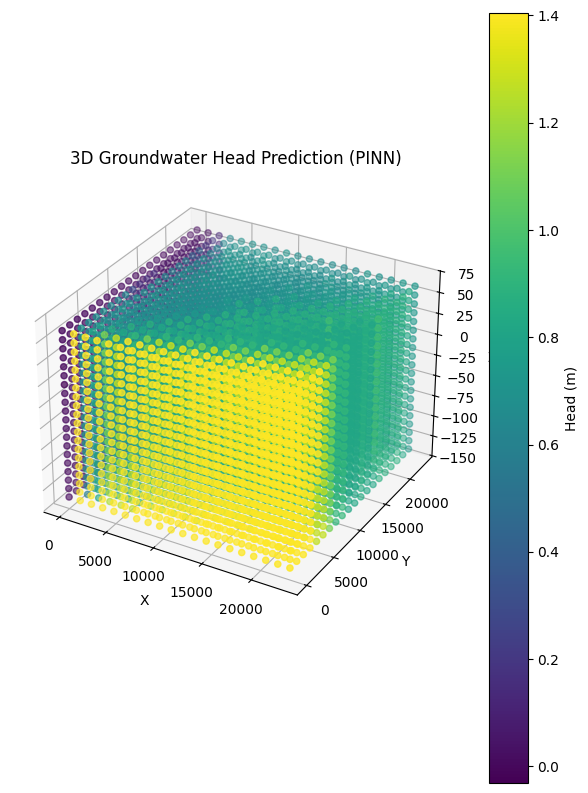

Epoch 1610: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1620: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1630: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1640: Loss = 2.2586e-01
Epoch 1650: Loss = 2.2586e-01
Epoch 1660: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1670: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1680: Loss = 2.2586e-01
Epoch 1690: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_1700.pkl
Epoch 1700: Loss = 2.2586e-01
Epoch 1700: Loss = 2.2586e-01


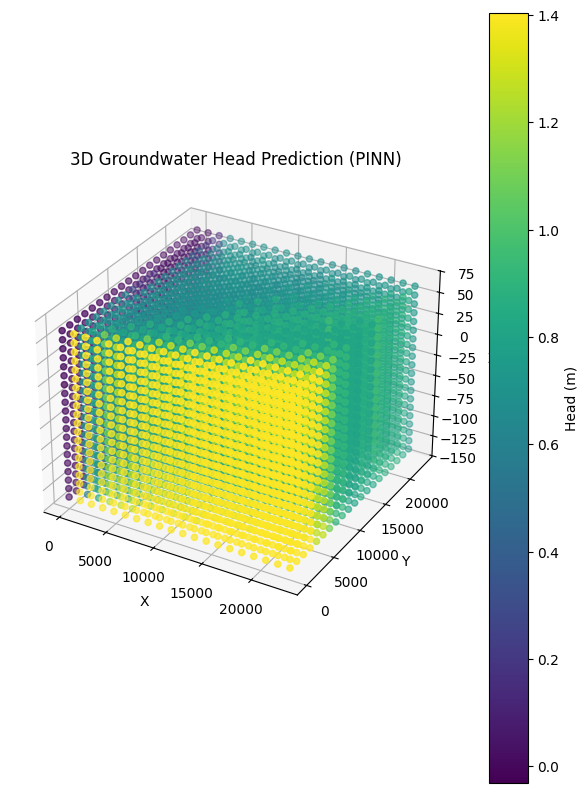

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1710: Loss = 2.2586e-01
Epoch 1720: Loss = 2.2586e-01
Epoch 1730: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1740: Loss = 2.2586e-01
Epoch 1750: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1760: Loss = 2.2586e-01
Epoch 1770: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1780: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1790: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_1800.pkl
Epoch 1800: Loss = 2.2586e-01
Epoch 1800: Loss = 2.2586e-01


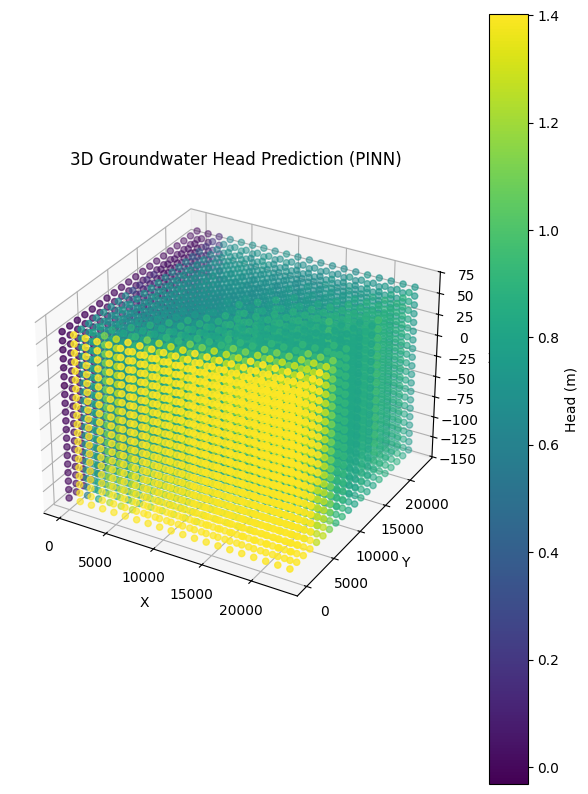

Epoch 1810: Loss = 2.2586e-01
Epoch 1820: Loss = 2.2586e-01
Epoch 1830: Loss = 2.2586e-01
Epoch 1840: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1850: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1860: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1870: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1880: Loss = 2.2586e-01
Epoch 1890: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_1900.pkl
Epoch 1900: Loss = 2.2586e-01
Epoch 1900: Loss = 2.2586e-01


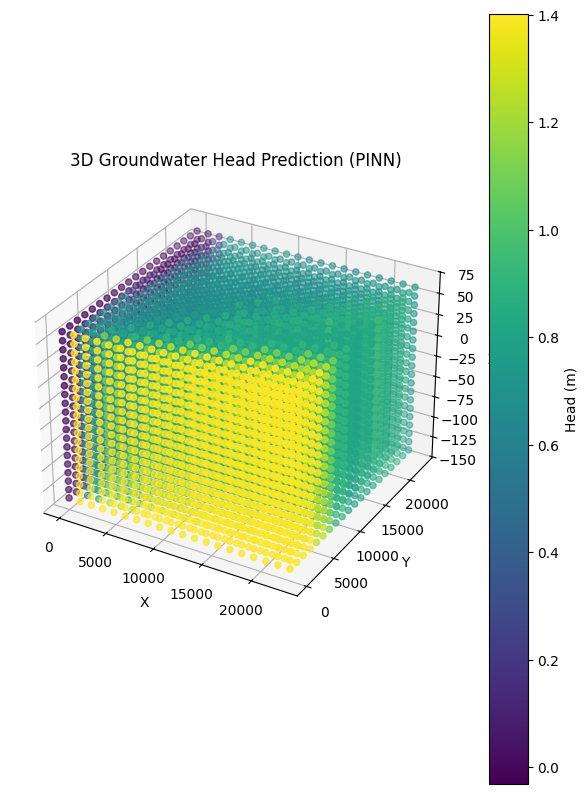

Epoch 1910: Loss = 2.2586e-01
Epoch 1920: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1930: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 1940: Loss = 2.2586e-01
Epoch 1950: Loss = 2.2586e-01
Epoch 1960: Loss = 2.2586e-01
Epoch 1970: Loss = 2.2586e-01
Epoch 1980: Loss = 2.2586e-01
Epoch 1990: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2000.pkl
Epoch 2000: Loss = 2.2586e-01
Epoch 2000: Loss = 2.2586e-01


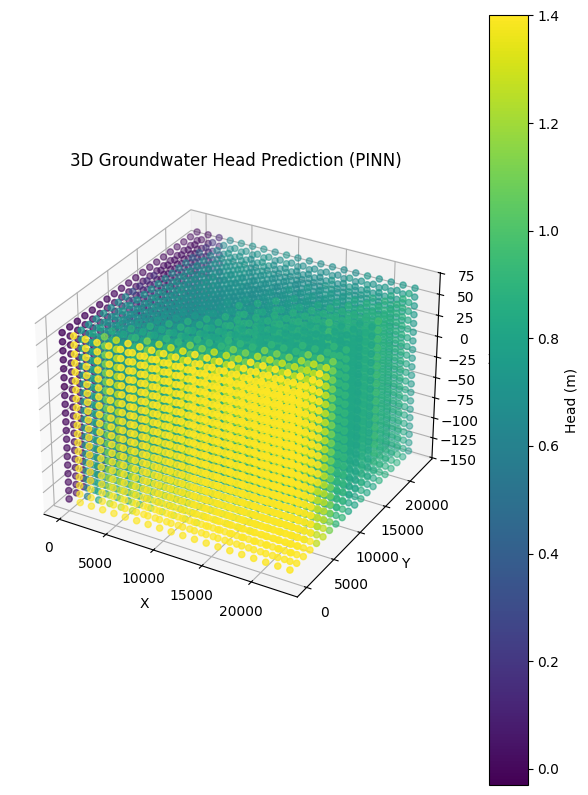

Epoch 2010: Loss = 2.2586e-01
Epoch 2020: Loss = 2.2586e-01
Epoch 2030: Loss = 2.2586e-01
Epoch 2040: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2050: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2060: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2070: Loss = 2.2586e-01
Epoch 2080: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2090: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2100.pkl
Epoch 2100: Loss = 2.2586e-01
Epoch 2100: Loss = 2.2586e-01


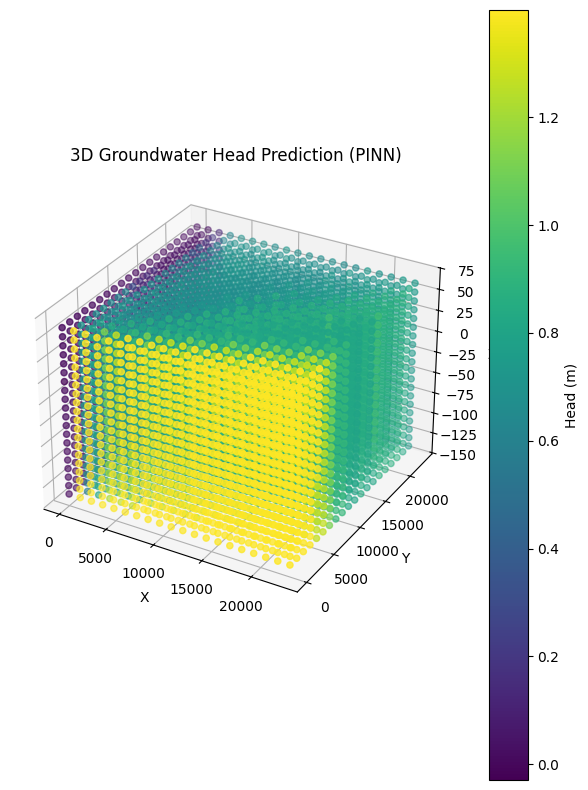

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2110: Loss = 2.2586e-01
Epoch 2120: Loss = 2.2586e-01
Epoch 2130: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2140: Loss = 2.2586e-01
Epoch 2150: Loss = 2.2586e-01
Epoch 2160: Loss = 2.2586e-01
Epoch 2170: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2180: Loss = 2.2586e-01
Epoch 2190: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2200.pkl
Epoch 2200: Loss = 2.2586e-01
Epoch 2200: Loss = 2.2586e-01


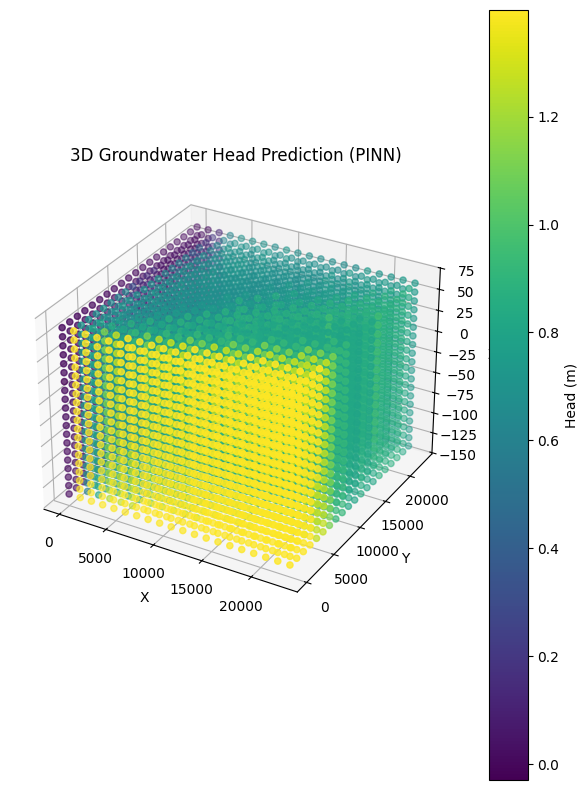

✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2210: Loss = 2.2586e-01
Epoch 2220: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2230: Loss = 2.2586e-01
Epoch 2240: Loss = 2.2586e-01
Epoch 2250: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2260: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2270: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2280: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2290: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2300.pkl


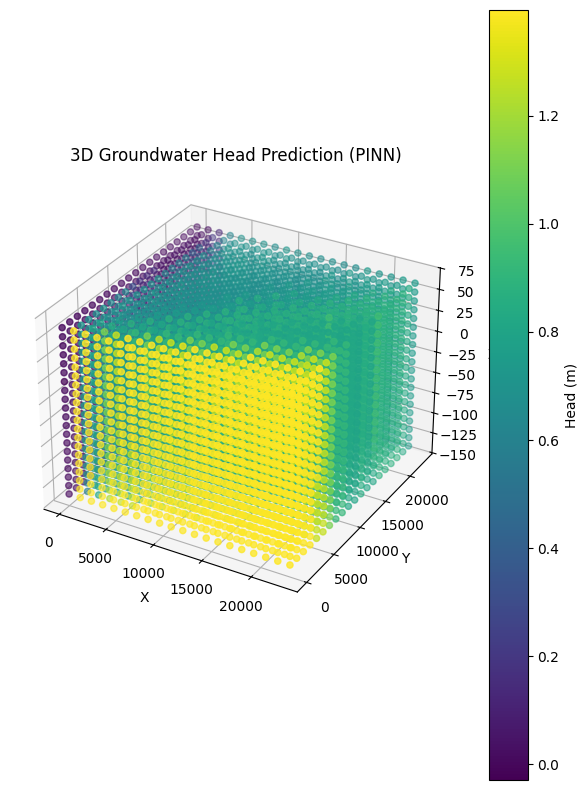

Epoch 2310: Loss = 2.2586e-01
Epoch 2320: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2330: Loss = 2.2586e-01
Epoch 2340: Loss = 2.2586e-01
Epoch 2350: Loss = 2.2586e-01
Epoch 2360: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2370: Loss = 2.2586e-01
Epoch 2380: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2390: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2400.pkl
Epoch 2400: Loss = 2.2586e-01
Epoch 2400: Loss = 2.2586e-01


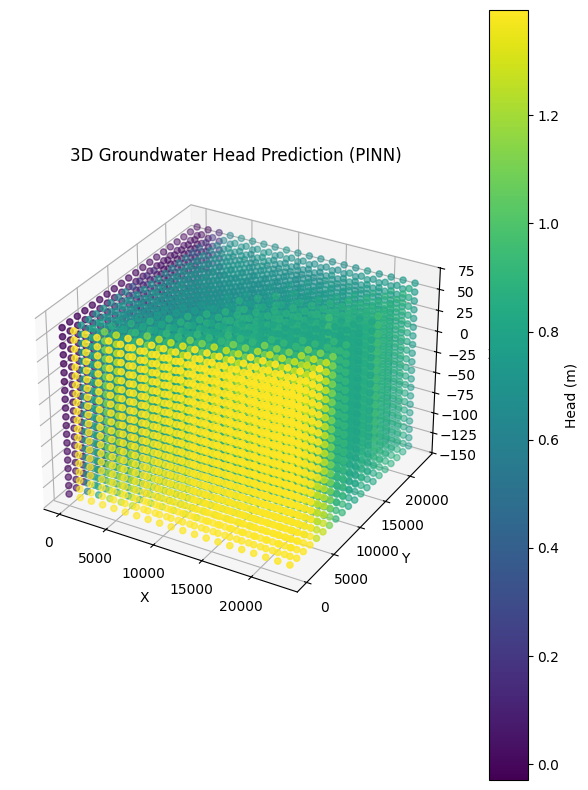

Epoch 2410: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/best_params_0421_softconstrained.pkl
Epoch 2420: Loss = 2.2586e-01
Epoch 2430: Loss = 2.2586e-01
Epoch 2440: Loss = 2.2586e-01
Epoch 2450: Loss = 2.2586e-01
Epoch 2460: Loss = 2.2586e-01
Epoch 2470: Loss = 2.2586e-01
Epoch 2480: Loss = 2.2586e-01
Epoch 2490: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2500.pkl
Epoch 2500: Loss = 2.2586e-01
Epoch 2500: Loss = 2.2586e-01


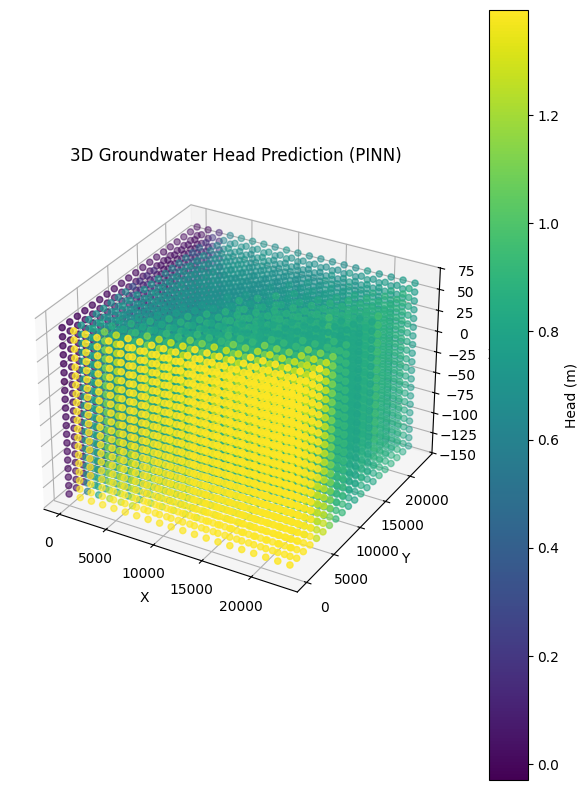

Epoch 2510: Loss = 2.2587e-01
Epoch 2520: Loss = 2.2587e-01
Epoch 2530: Loss = 2.2587e-01
Epoch 2540: Loss = 2.2587e-01
Epoch 2550: Loss = 2.2587e-01
Epoch 2560: Loss = 2.2587e-01
Epoch 2570: Loss = 2.2587e-01
Epoch 2580: Loss = 2.2587e-01
Epoch 2590: Loss = 2.2587e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2600.pkl
Epoch 2600: Loss = 2.2587e-01
Epoch 2600: Loss = 2.2587e-01


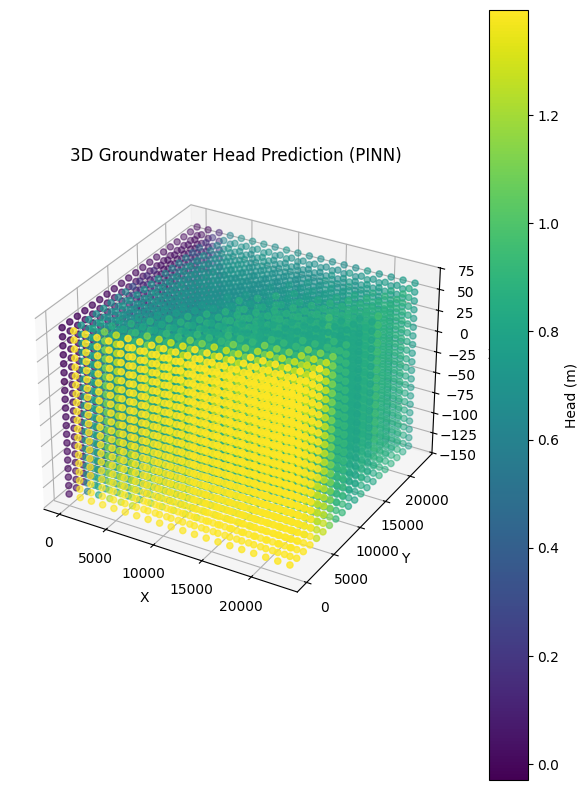

Epoch 2610: Loss = 2.2587e-01
Epoch 2620: Loss = 2.2587e-01
Epoch 2630: Loss = 2.2587e-01
Epoch 2640: Loss = 2.2587e-01
Epoch 2650: Loss = 2.2587e-01
Epoch 2660: Loss = 2.2587e-01
Epoch 2670: Loss = 2.2587e-01
Epoch 2680: Loss = 2.2586e-01
Epoch 2690: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2700.pkl
Epoch 2700: Loss = 2.2586e-01
Epoch 2700: Loss = 2.2586e-01


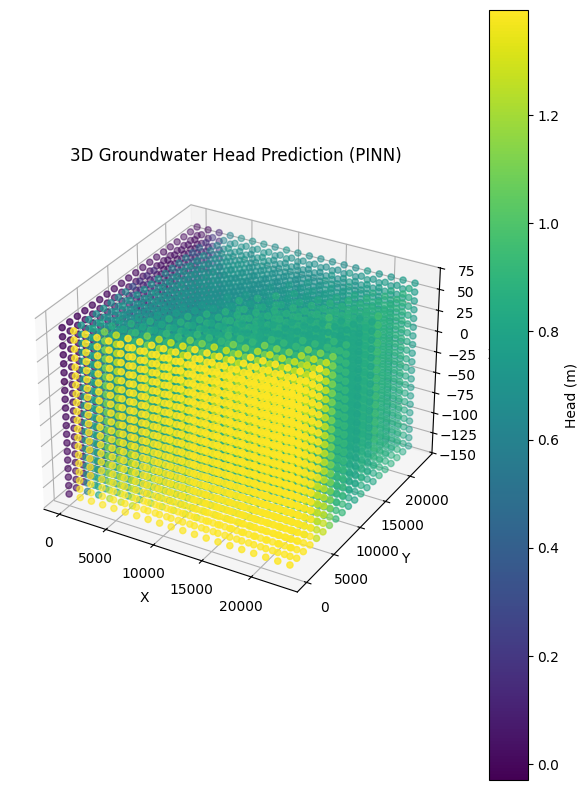

Epoch 2710: Loss = 2.2586e-01
Epoch 2720: Loss = 2.2586e-01
Epoch 2730: Loss = 2.2586e-01
Epoch 2740: Loss = 2.2586e-01
Epoch 2750: Loss = 2.2586e-01
Epoch 2760: Loss = 2.2586e-01
Epoch 2770: Loss = 2.2586e-01
Epoch 2780: Loss = 2.2586e-01
Epoch 2790: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2800.pkl
Epoch 2800: Loss = 2.2586e-01
Epoch 2800: Loss = 2.2586e-01


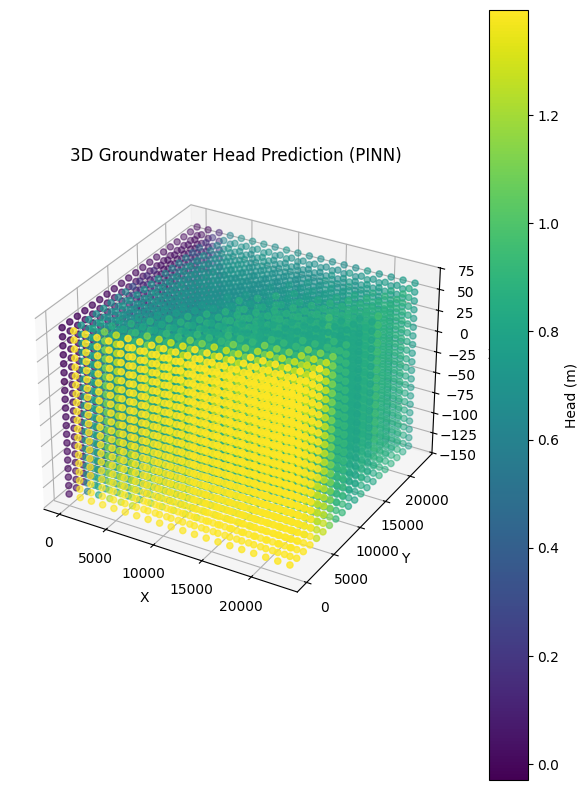

Epoch 2810: Loss = 2.2586e-01
Epoch 2820: Loss = 2.2586e-01
Epoch 2830: Loss = 2.2586e-01
Epoch 2840: Loss = 2.2586e-01
Epoch 2850: Loss = 2.2586e-01
Epoch 2860: Loss = 2.2586e-01
Epoch 2870: Loss = 2.2586e-01
Epoch 2880: Loss = 2.2586e-01
Epoch 2890: Loss = 2.2586e-01
✅ Parameters saved at /content/drive/MyDrive/backup_params_epoch_2900.pkl
Epoch 2900: Loss = 2.2586e-01
Epoch 2900: Loss = 2.2586e-01


KeyboardInterrupt: 

In [26]:
# Training PINN
n_hl = 5  # Number of hidden layers
n_nodes = 50  # Number of nodes per layer
lr = 1E-1  # Learning rate
epoch = 30000  # Number of epochs

layers = [3, 100, 500, 100, 1]  # Neural network architecture

(x_const, y_const, z_const, bc_const, BC_const,
    x_re, y_re, z_re,bc_re, BC_re,
    x_dr, y_dr, z_dr, q_dr, BC_dr,
    x_nf_xmin, y_nf_xmin, z_nf_xmin, bc_nf_xmin, BC_nf_xmin,
    x_nf_xmax, y_nf_xmax, z_nf_xmax, bc_nf_xmax, BC_nf_xmax,
    x_nf_ymin, y_nf_ymin, z_nf_ymin, bc_nf_ymin, BC_nf_ymin,
    x_nf_ymax, y_nf_ymax, z_nf_ymax, bc_nf_ymax, BC_nf_ymax,
    x_nf_zmin, y_nf_zmin, z_nf_zmin, bc_nf_zmin, BC_nf_zmin,
    x_c, y_c, z_c, colloc, conds) = generate_BCs_and_colloc(N_b, N_r, xmin, xmax, ymin, ymax, zmin, zmax)

# Initialize neural network
key = random.PRNGKey(1234)
params = init_mlp(layers, key)

# Initialize optimizer
# scheduler = optax.cosine_decay_schedule(init_value=1E-2, decay_steps=epoch, alpha=0.1)
scheduler = optax.cosine_decay_schedule(init_value=5E-3, decay_steps=epoch, alpha=0.001)
optimizer = optax.adam(scheduler)
opt_state = optimizer.init(params)
colloc_h_init = jax.random.uniform(random.PRNGKey(0), shape=(colloc.shape[0], 1), minval=1, maxval=10)  # 초기 압력값을 랜덤하게 설정
# colloc_h_init = jnp.zeros((colloc.shape[0],1))
# colloc_h_init = jnp.ones((colloc.shape[0], 1)) * 60
def save_params(params, path):
    with open(path, 'wb') as f:
        pickle.dump(params, f)
    print(f"✅ Parameters saved at {path}")

def load_params(path):
    with open(path, 'rb') as f:
        params = pickle.load(f)
    print(f"✅ Parameters loaded from {path}")
    return params

save_path = '/content/drive/MyDrive/best_params_0421_softconstrained.pkl'

@jit
def update(params, opt_state, colloc, conds, colloc_h_init):
    """
    Perform one optimization step.
    """
    value, grads = jax.value_and_grad(loss_func)(params, colloc, conds, colloc_h_init)

    updates, opt_state = optimizer.update(grads, opt_state)
    params = optax.apply_updates(params, updates)
    return value, params, opt_state


# Training loop
all_losses = []
all_epochs = []
min_loss = jnp.inf
best_params = None

for i in range(epoch + 1):
    loss, params, opt_state = update(params, opt_state, colloc, conds, colloc_h_init)
    all_losses.append(loss)

    all_epochs.append(i)
    if loss < min_loss:
        min_loss = loss
        best_params = params
        best_iteration = i
        save_params(best_params, save_path)

      # 100 epoch마다 현재 params backup 저장
    if i % 100 == 0 and i != 0:
        save_params(params, f'/content/drive/MyDrive/backup_params_epoch_{i}.pkl')
        # 10 epoch마다 loss 출력
    if i % 10 == 0:
        print(f"Epoch {i}: Loss = {loss:.4e}")
    if i % 100 == 0:
        print(f"Epoch {i}: Loss = {loss:.4e}")
        # Predict head using the trained neural network
        h_pinn = neural_net(best_params, xyz_points )  # Output will be (nx*ny*nz, 1)
        h_pinn = h_pinn.reshape(nx, ny, nz)  # Reshape back to grid

        # 3D Visualization of PINN Solution
        fig = plt.figure(figsize=(16, 10))
        ax = fig.add_subplot(121, projection='3d')
        scat = ax.scatter(X, Y, Z, c=h_pinn.ravel(), cmap='viridis')
        plt.colorbar(scat, ax=ax, label='Head (m)')
        ax.set_xlabel('X')
        ax.set_ylabel('Y')
        ax.set_zlabel('Z')
        ax.set_title('3D Groundwater Head Prediction (PINN)')

        plt.show()

print(f"\nBest Model:")
print(f"Best loss: {min_loss:.4e} at iteration {best_iteration}\n")

In [ ]:
load_params(content/drive/MyDrive/best_params.pkl)

In [ ]:
def plot_pinn_training(all_losses, all_epochs):
    plt.figure(figsize = (5, 4), dpi = 150)
    plt.semilogy(all_epochs, all_losses, '-r', markersize = 4, linewidth = 1.0)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    #plt.legend(prop={"size": fontsize_legend}, loc="best")
    plt.xlim(min(all_epochs), max(all_epochs))
    plt.tight_layout()

plot_pinn_training(all_losses, all_epochs)

In [ ]:
# 3D Visualization of PINN Solution
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')
scat = ax.scatter(X, Y, Z, c=h_pinn.ravel(), cmap='viridis')
plt.colorbar(scat, ax=ax, label='Head (m)')
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('3D Groundwater Head Prediction (PINN)')

plt.show()
